# **Introduction to Image Processing**

Most of the times, when people think of working with images, **photoshop** is what comes to mind. In this notebook we will learn how to using **Python for image processing** using PIL library.

The **Python Imaging Library** adds image processing capabilities to your Python interpreter.

## **What's Covered?**
1. Digital Image Representation 
    - Image Types
    - Color Image Modes
    - Image Formats
2. Loading Images with Matplotlib
3. Loading Images with PIL
4. Images as Arrays
    - Creating a PIL Image
    - Get Pixel Value
    - Set Pixel Value
    - Converting PIL Image to Numpy Array
5. Segregating Channels from a Color Image
6. Convert Image Modes
7. Image Manipulation with PIL
    - Rotating
    - Flipping and Transpose
    - Cropping
    - Padding
    - Resizing
    - Thumbnail
    - Saving an Image
8. Image Enhancement
    - Color Enhancement
    - Contrast Enhancement
    - Brightness Enhancement
    - Sharpness Enhancement
9. Image Filters
    - Gaussian Blur
    - Box Blur
    - Median Filter
    - Sobel Operator
    - Contour Filter
    - Emboss Filter
10. Morphological Operations
    - Erosion
    - Dilation
11. Miscellaneous Image Operations in PIL
    - Blending Images Together
    - Overlay Images
    - Circular Cropping

## **Digital Image Representation**
An image is represented as a matrix of Pixel values. Each pixel can have different values depending on the image type.

**Pixel:** In digital imaging, a pixel (abbreviated px), or picture element is the smallest addressable element in an image, or the smallest addressable element in a dot matrix display device. In most digital display devices, pixels are the smallest element that can be manipulated through software.

**RGB (Red, Green, and Blue):** In digital imaging RGB are the primary color of light. The RGB color model is an additive color model where colors are created by combining these three primary colors in various intensities. Each color in the RGB model is represented by a combination of three values, one for each primary color, typically ranging from 0 to 255. In the RGB model, each pixel in an image is represented by three values corresponding to the intensity of red, green, and blue light


### **a. Image Types**
1. **Binary Image (AKA 1bit Gray Scale):** Consists of pixels with values 0 (for black) and 1 (for white). Useful for black and white document scanning.
2. **Grayscale Image:** Represented as a 2D array where each value corresponds to the intensity (0-255 for 8-bit image), ranging from black to white.
3. **Color Image:** It is represented as a 3D array. Include multiple channels (typically RGB). Each channel represent a different color component. Each channel is a grayscale representing the intensity level of that color. There are several popular **Image Modes** for color images in digital imaging.

<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title></title>
    <style>
        .image-row {
            display: flex;
            justify-content: center;
            gap: 10px; /* Space between images */
            margin: 20px 0; /* Space above and below the image row */
        }
        .image-row img {
            max-width: 100%; /* Make images responsive */
            height: auto; /* Maintain aspect ratio */
        }
    </style>
</head>
<body>
    
<div class="image-row">
        <img src="images/image_types/1bit_grayscale_image.png" alt="1-bit Gray Scale Image">
        <img src="images/image_types/8bit_grayscale_image.png" alt="8-bit Gray Scale Image">
        <img src="images/image_types/8bit_rgb_image.jpg" alt="8-bit RGB Scale Image">
</div>

</body>
</html>


### **b. Color Image Modes**
An image mode determines the number of colors that can be displayed in an image and can also affect the file size of the image.
Image modes represent the color space or the number of channels in an image. The most common image modes include:
1. **RGB (Red, Green, Blue):** The most common and general purpose color mode for digital images. Each pixel is composed of three color channels: Red, Green, and Blue.
2. **RGBA (Red, Green, Blue, Alpha):** Similar to RGB but includes an additional channel (alpha) for representing transparency. Used for Web Graphics to create images with transparent backgrounds.
3. **CMYK (Cyan, Magenta, Yellow, Key/Black):** Used in color printing. It represents colors using four channels: Cyan (sai-an), Magenta, Yellow, and Black.
4. **Indexed (AKA Palette) Color:** Uses a color palette to represent the image. Each pixel's color is an index into the palette.
5. **HSV (Hue, Saturation, Value):** HSV is often used in computer vision and image processing tasks because it separates color information from brightness, making certain operations more intuitive.

### **c. Image Formats**
Image formats refer to the ways in which digital images are encoded and stored. Each format has its own specifications for representing color information, transperancy, compression, and other features. Common image formats include:
1. **JPEG (Joint Photographic Experts Group):** Well-suited for photographs and images with complex color gradients. It uses lossy compression. Reduces file size significantly at the cost of some image quality. 
2. **PNG (Portable Network Graphics):** Suitable for images with transparency and sharp edges, such as logos and icons. It uses lossless compression.
3. **GIF (Graphics Interchange Format):** Often used for simple graphics, animations, and images with a limited color palette. It uses lossless compression and supports animation.
4. **TIFF (Tagged Image File Format):** A flexible format suitable for high-quality images and professional printing. It supports lossless compression and can store multiple images in a single file.
5. **BMP (Bitmap by Microsoft):** A basic, uncompressed format used for simple graphics. It stores color information pixel by pixel.
6. **RAW:** A format used to store minimally processed data from the image sensor of a digital camera. It retains more information but results in larger file sizes.
7. **WebP (by Google):** It provides both lossy and lossless compression. It aims for smaller file sizes while maintaining image quality.
8. **HEIC:** Suitable for mobile photography (like iphone).

In [1]:
import numpy as np
import pandas as pd

## **Loading Images with Matplotlib**

<class 'numpy.ndarray'> (452, 640, 3)


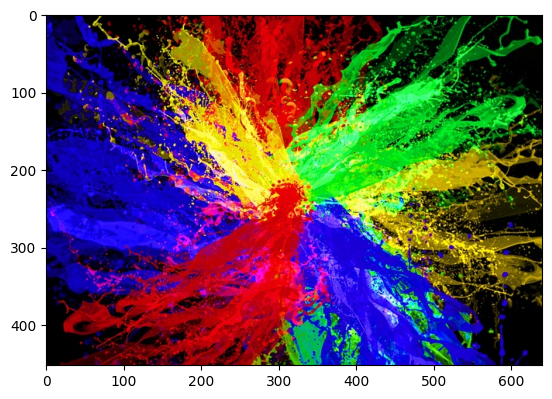

In [8]:
from matplotlib import image
import matplotlib.pyplot as plt

img = image.imread('images/original_imgs/test_image.jpg')

print(type(img), img.shape)

plt.imshow(img)

## **Loading Images with PIL**

<class 'PIL.JpegImagePlugin.JpegImageFile'> (640, 452)


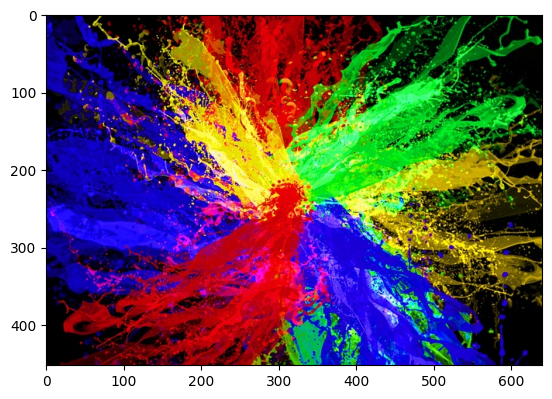

In [9]:
from PIL import Image

img = Image.open('images/original_imgs/test_image.jpg')

print(type(img), img.size)

plt.imshow(img)

In [10]:
# img.show() # Opens in new window
# display(img)

In [11]:
# Properties of PIL Image Object

print("Image File Name:", img.filename)

print("Shape/Size of Image:", img.size) # (Width, Height in pixels)

print("Image Mode:", img.mode)

print("Image Format:", img.format)

Image File Name: images/original_imgs/test_image.jpg
Shape/Size of Image: (640, 452)
Image Mode: RGB
Image Format: JPEG


## **Images as Arrays**

What is an image? So far, PIL has handled loading images and displaying them. However, if we're going to use images as data, we need to understand what that data looks like.  
Most image formats have three color "channels": Red, Green, and Blue (some images also have a fourth channel called "alpha" that controls transparency). For each pixel in an image, there is a value for every channel.

The way this is represented as data is as a three-dimensional matrix. The width of the matrix is the width of the image, the height of the matrix is the height of the image, and the depth of the matrix is the number of channels. So, as we saw, the height and width of our image are both 100 pixels. This means that the underlying data is a matrix with the dimensions `100x100x3`.


### **a. Creating a PIL Image**

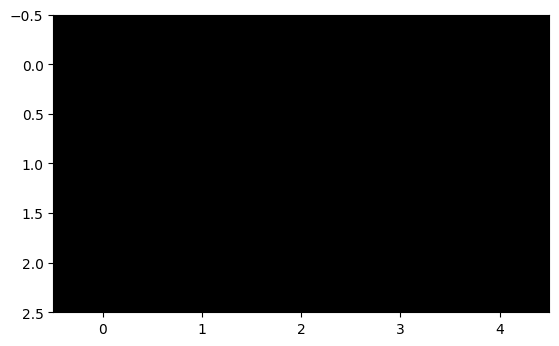

In [2]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.new(mode="RGB", size=(5, 3), color=(0, 0, 0))

plt.imshow(img)

### **b. Get Pixel Value**

In [3]:
# (x, y) position
xy = (2, 1)

# Get pixel value
pixel_value = img.getpixel(xy)
print(pixel_value)

(0, 0, 0)


### **c. Set Pixel Value**

(255, 255, 255)


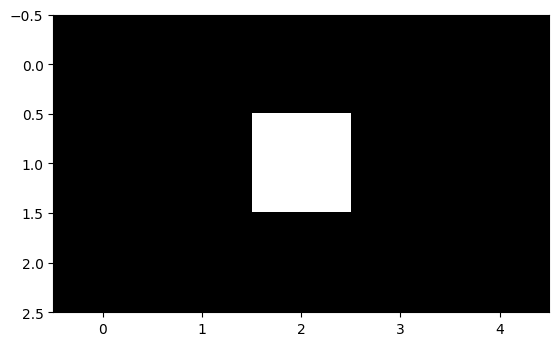

In [4]:
# (x, y) position
xy = (2, 1)

# Pixel value
value = (255, 255, 255)

# Set pixel value
img.putpixel(xy, value)

# Get pixel value
pixel_value = img.getpixel(xy)
print(pixel_value)

plt.imshow(img)

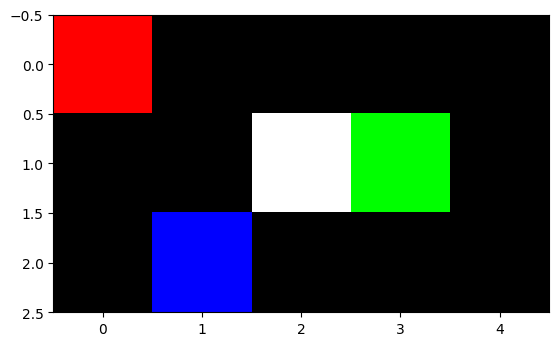

In [5]:
# (x, y) position
xy_1 = (0, 0)
xy_2 = (3, 1)
xy_3 = (1, 2)

# Pixel value
value_1 = (255, 0, 0)
value_2 = (0, 255, 0)
value_3 = (0, 0, 255)

# Set pixel value
img.putpixel(xy_1, value_1)
img.putpixel(xy_2, value_2)
img.putpixel(xy_3, value_3)

plt.imshow(img)

### **d. Converting PIL Image to Numpy Array**

In [6]:
# Turn our image object into a NumPy array
img_arr = np.array(img)

print(img_arr)

[[[255   0   0]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [255 255 255]
  [  0 255   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0 255]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]


```python
# This is equivalent to the following representation
array = np.array([  
    [[  255,   0,   0], [  0,   0,   0], [  0,   0,   0], [  0,   0,   0], [  0,   0,   0]],  
    [[  0,   0,   0], [  0,   0,   0], [255, 255, 255], [  0,   255,   0], [  0,   0,   0]],  
    [[  0,   0,   0], [  0,   0,   255], [  0,   0,   0], [  0,   0,   0], [  0,   0,   0]]  
])
```

### **e. Saving an Image**

In [7]:
img.save('images/transformed/black_with_rgb_dot.jpg')

## **Segregating Channels from a Color Image**

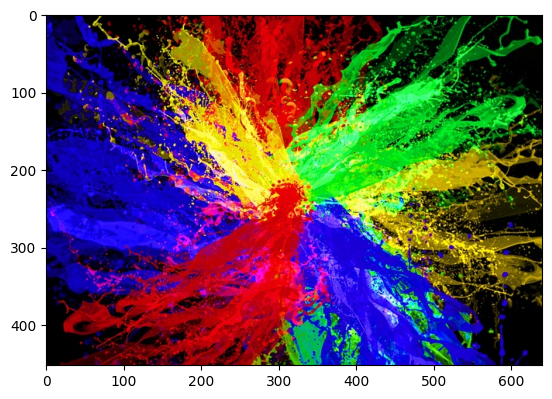

In [12]:
img = Image.open('images/original_imgs/test_image.jpg')

plt.imshow(img)

In [13]:
# Turn our image object into a NumPy array
img_arr = np.array(img)

print("PIL Image:")
print("Type:", type(img))
print("Shape/Size:", img.size)
print()
print("After converting PIL image to Numpy Array:")
print("Type:", type(img_arr))
print("Shape/Size:", img_arr.shape)

PIL Image:
Type: <class 'PIL.JpegImagePlugin.JpegImageFile'>
Shape/Size: (640, 452)

After converting PIL image to Numpy Array:
Type: <class 'numpy.ndarray'>
Shape/Size: (452, 640, 3)


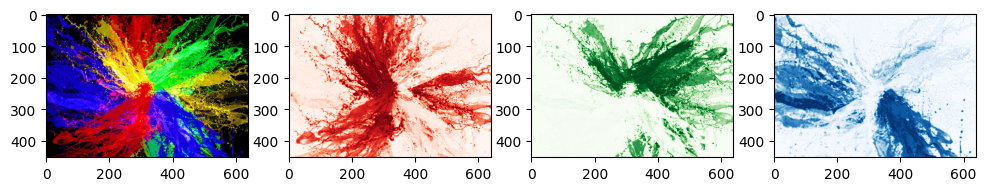

In [14]:
plt.figure(figsize=(12, 12))

plt.subplot(1, 4, 1)
plt.imshow(img_arr)

plt.subplot(1, 4, 2)
plt.imshow(img_arr[:,:,0], cmap='Reds')

plt.subplot(1, 4, 3)
plt.imshow(img_arr[:,:,1], cmap='Greens')

plt.subplot(1, 4, 4)
plt.imshow(img_arr[:,:,2], cmap='Blues')

In [15]:
# Another way to segregate the channels
img.split()

(<PIL.Image.Image image mode=L size=640x452>,
 <PIL.Image.Image image mode=L size=640x452>,
 <PIL.Image.Image image mode=L size=640x452>)

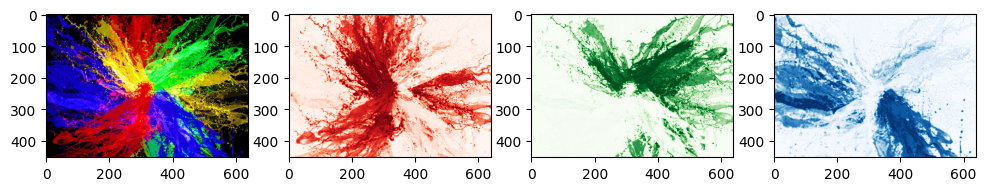

In [16]:
red, green, blue = img.split()

plt.figure(figsize=(12, 12))

plt.subplot(1, 4, 1)
plt.imshow(img)

plt.subplot(1, 4, 2)
plt.imshow(red, cmap='Reds')

plt.subplot(1, 4, 3)
plt.imshow(green, cmap='Greens')

plt.subplot(1, 4, 4)
plt.imshow(blue, cmap='Blues')

## **Convert Image Modes**

It is used to change the mode of an image. The mode of an image defines the type and depth of a pixel in the image. Different modes support different types of images, and converting between them can be useful for various image processing tasks.

### **Common Image Modes in Pillow**

1. **"1" (1-bit pixels, black and white, stored with one pixel per byte)**
> - **Purpose:** For creating binary images.
> - **Application:** Document scanning, simple graphics.

2. **"L" (8-bit pixels, grayscale)**
> - **Purpose:** For grayscale images where each pixel is represented by a single byte.
> - **Application:** Image processing tasks where color is not important, reducing image size.

3. **"P" (8-bit pixels, mapped to any other mode using a color palette)**
> - **Purpose:** For images with a limited number of colors (up to 256).
> - **Application:** Saving storage space in image files, GIF images.

4. **"RGB" (3x8-bit pixels, true color)**
> - **Purpose:** For standard true-color images with red, green, and blue channels.
> - **Application:** Most common for displaying images in full color.

5. **"RGBA" (4x8-bit pixels, true color with transparency mask)**
> - **Purpose:** For true-color images with an alpha channel for transparency.
> - **Application:** Web graphics, icons, images with varying transparency.

6. **"CMYK" (4x8-bit pixels, color separation)**
> **Purpose:** For color printing.
> **Application:** Preparing images for printing processes.

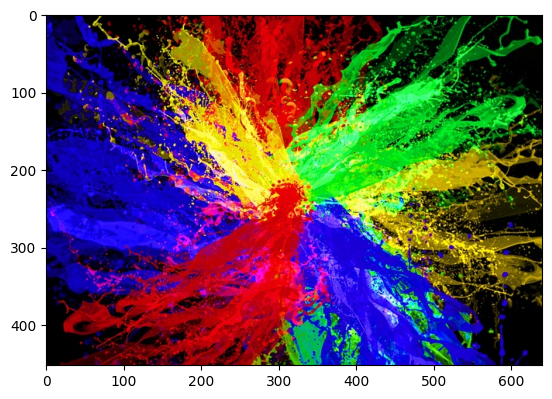

In [17]:
from PIL import Image

# Open an image file
image = Image.open('images/original_imgs/test_image.jpg')

plt.imshow(image)

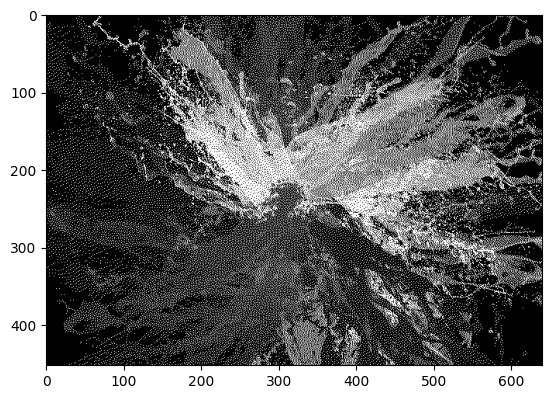

In [18]:
# Convert to binary_scale
binary_image = image.convert('1')

plt.imshow(binary_image)

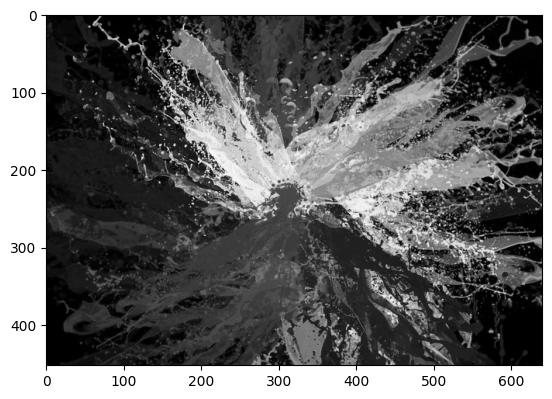

In [19]:
# Convert to grayscale
gray_image = image.convert('L')

plt.imshow(gray_image, cmap="gray")

In [20]:
print(np.array(binary_image))

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [21]:
print(np.array(gray_image))

[[11 10 10 ...  0  0  0]
 [11 11 11 ...  0  0  0]
 [11 11 12 ...  0  0  0]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]


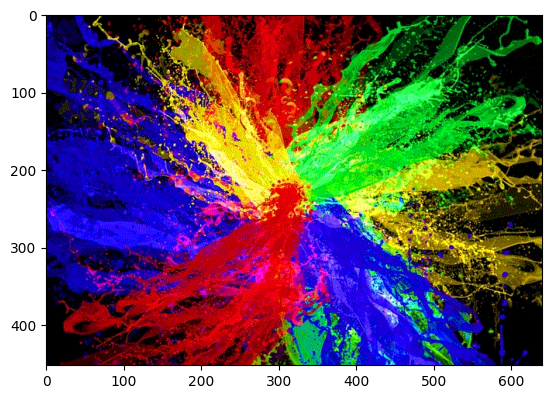

In [22]:
# Convert to palette image
palette_image = image.convert('P')

plt.imshow(palette_image)

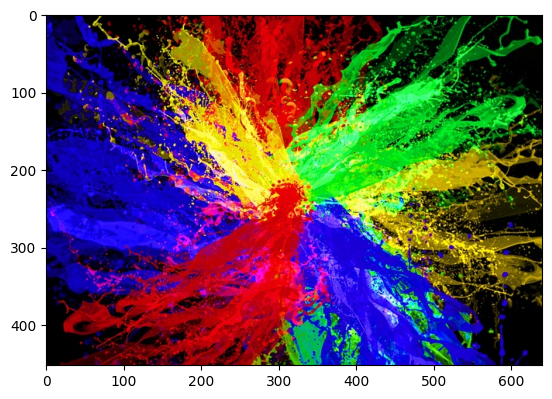

In [23]:
# Convert to RGBA
rgba_image = image.convert('RGBA')

plt.imshow(rgba_image)

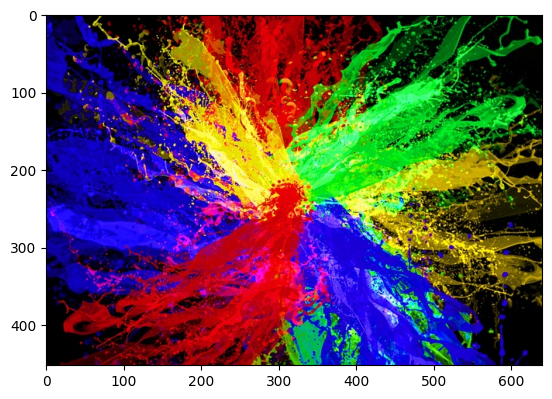

In [24]:
# Convert to CMYK
cmyk_image = image.convert('CMYK')

plt.imshow(cmyk_image)

## **Image Manipulation with PIL**

Image manipulation involves a variety of operations that alter an image in some way. These operations can include resizing, cropping, rotating, flipping, and more. Each of these manipulations serves different purposes in image processing and computer vision. Here’s a detailed discussion of the common image manipulation operations:
- rotating
- flipping
- cropping
- resizing

Pillow has a number of common image manipulation tasks built into the library. For example, one may want to resize an image so that the file size is smaller. Or, perhaps, convert an image to black-and-white instead of color. Operations that Pillow provides include:


Often, these kinds of manipulations are part of the pipeline for turning a small number of images into more images to create training data for machine learning algorithms. This technique is called **`data augmentation`**, and it is a common technique for image classification.  
We'll try a couple of these operations and look at the results.

### **a. Rotating**
Rotating an image changes its orientation by a specified angle. Fixes the orientation of images taken at an angle.

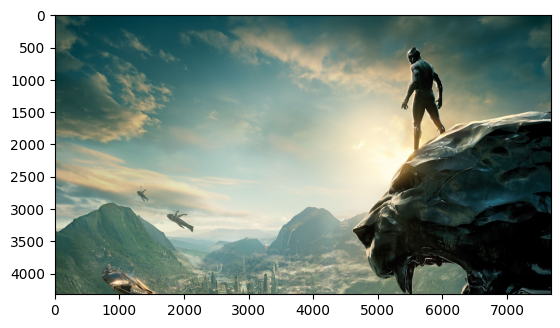

In [25]:
from PIL import Image

img = Image.open('images/original_imgs/bp.jpg')

plt.imshow(img)

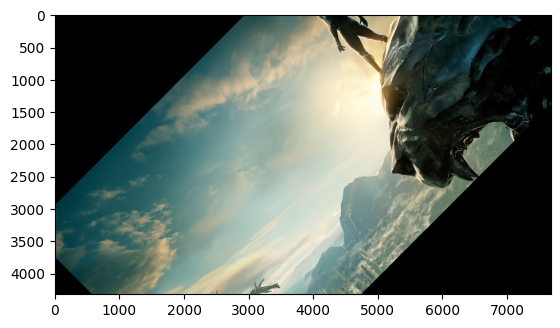

In [26]:
# rotate the image by 45 degrees

img_rotated = img.rotate(45)
plt.imshow(img_rotated)

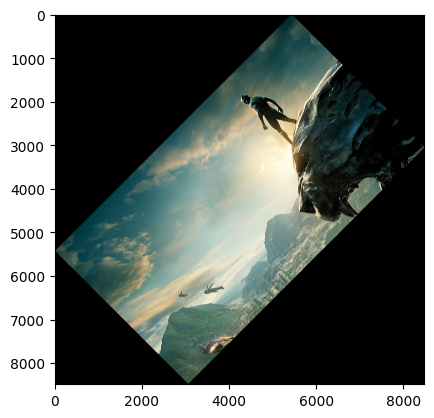

In [27]:
# rotate the image by 45 degrees and expand=True

img_rotated = img.rotate(45, expand=True)
plt.imshow(img_rotated)

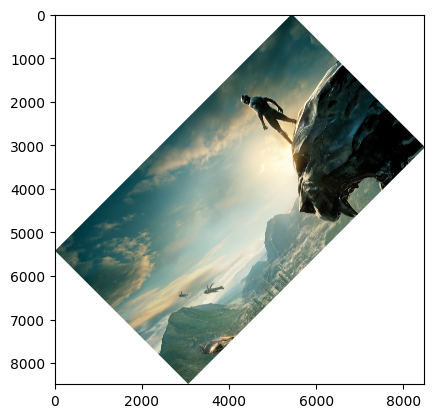

In [28]:
# rotate the image by 45 degrees with fillcolor

img_rotated = img.rotate(45, expand=True, fillcolor=(255,255,255))
plt.imshow(img_rotated)

### **b. Flipping and Transpose**
Flipping mirrors the image along a specified axis (horizontal or vertical).

Transposing involves flipping an image across its diagonal, effectively swapping its width and height.

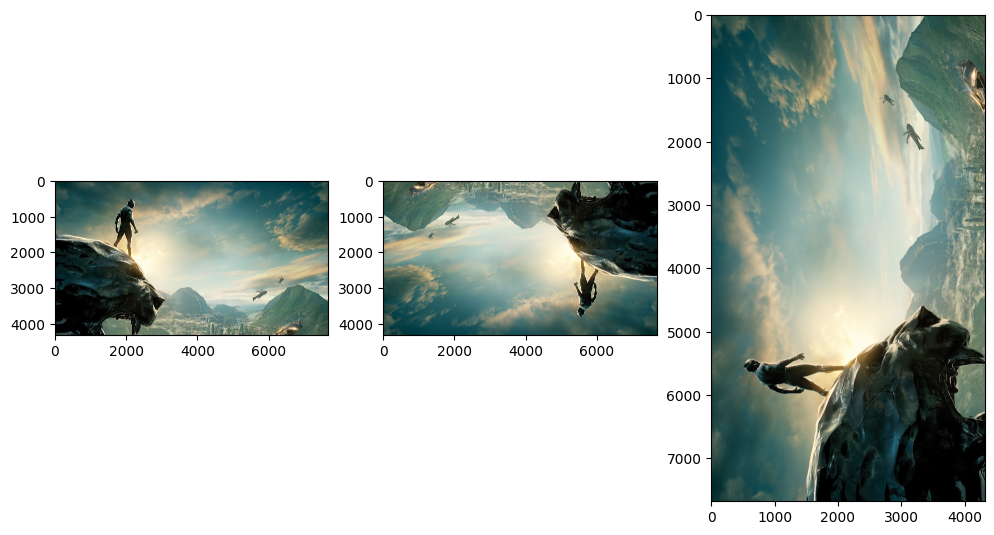

In [29]:
plt.figure(figsize=(12, 12))

plt.subplot(1, 3, 1)
# flip the image left to right
img_flipped_horizontal = img.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
plt.imshow(img_flipped_horizontal)

plt.subplot(1, 3, 2)
# flip the image left to right
img_flipped_vertical = img.transpose(Image.Transpose.FLIP_TOP_BOTTOM)
plt.imshow(img_flipped_vertical)

plt.subplot(1, 3, 3)
# flip the image left to right
img_flipped = img.transpose(Image.Transpose.TRANSPOSE)
plt.imshow(img_flipped)

### **c. Cropping**

Cropping removes unwanted outer areas from an image to focus on a particular region of interest. Removes irrelevant parts and focuses on the main subject.

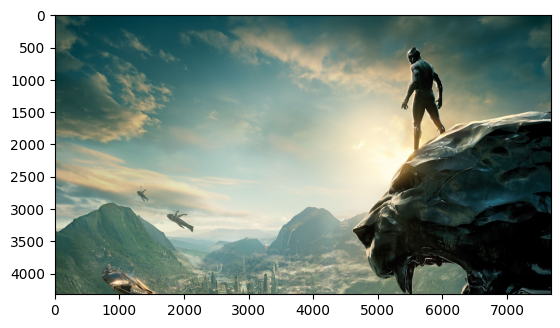

In [30]:
plt.imshow(img)

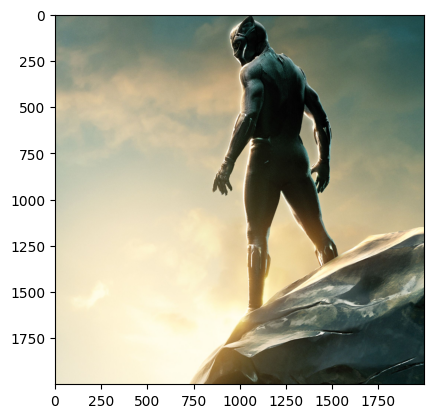

In [31]:
# Crop the image to 25, 25, 75, 75 - Left_x, top_y, right_x, bottom_y
img_cropped = img.crop((4500, 500, 6500, 2500))

plt.imshow(img_cropped)

### **d. Padding**

Padding adds borders to an image, usually with a specific color, to change its dimensions or aspect ratio.

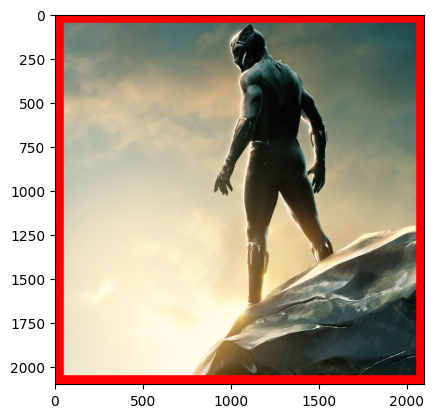

In [32]:
from PIL import ImageOps

# Add padding to the image
padded_img = ImageOps.expand(img_cropped, border=50, fill='red')

plt.imshow(padded_img)

### **e. Resizing**

Resizing changes the dimensions of an image. This can be done to either enlarge or reduce the size of an image.

In [33]:
new_img = img.resize((200, 200))

print("Original Image Size:", img.size) # Output: (7680, 4320)
print("Resized Image Size:", new_img.size) # Output: (200, 200)

Original Image Size: (7680, 4320)
Resized Image Size: (200, 200)


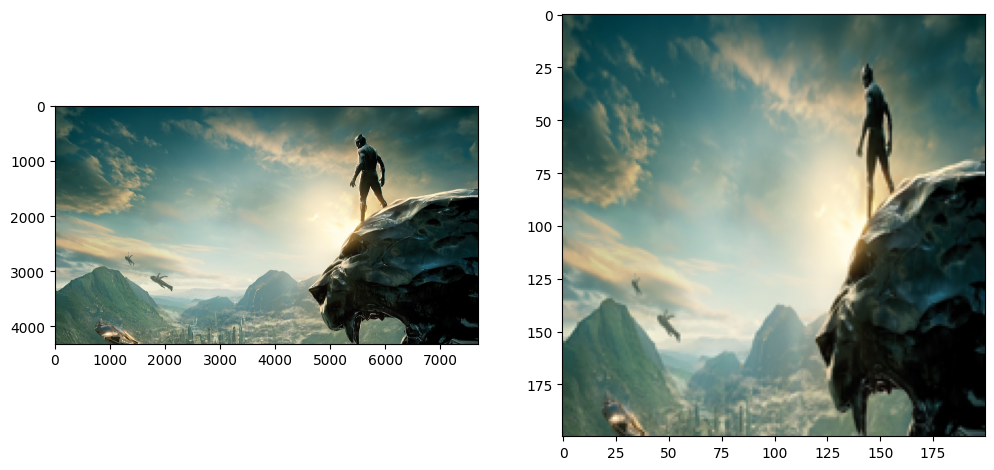

In [34]:
plt.figure(figsize=(12, 12))

plt.subplot(1, 2, 1)
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.imshow(new_img)

### **f. Thumbnail**

Resized Image Size: (200, 113)


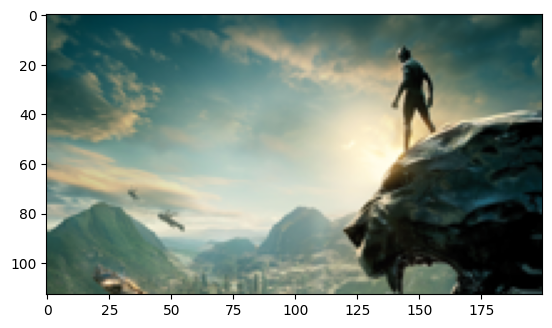

In [35]:
# thumbnail take cares of the aspect ratio

img.thumbnail((200, 200))

print("Resized Image Size:", img.size)

plt.imshow(img)

## **Image Enhancement**

Image enhancement encompasses various techniques aimed at improving the visual quality of an image. These techniques can adjust attributes like brightness, contrast, sharpness, and color balance to make images more visually appealing or suitable for specific applications.

PIL can change the vibrance, contrast, brightness and sharpness using ImageEnhance.

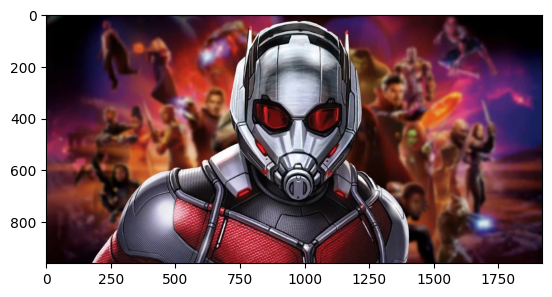

In [36]:
img = Image.open('images/original_imgs/quantumania_2.png')

plt.imshow(img)

### **a. Color Enhancement**

Color adjustment alters the color balance and saturation of an image. It can make colors appear more vibrant or desaturated, depending on the desired effect.


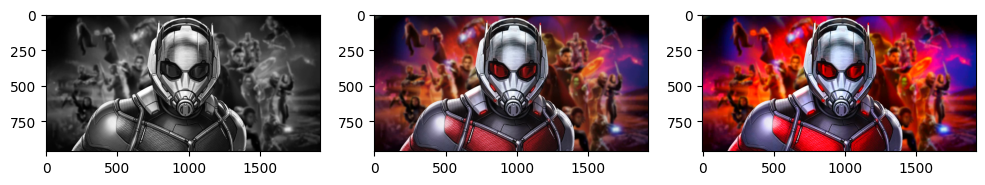

In [37]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

# vibrance enhancer - use 0, 1, 1.5, 2, etc
color_enhancer = ImageEnhance.Color(img)

plt.subplot(1, 3, 1)
plt.imshow(color_enhancer.enhance(0))

plt.subplot(1, 3, 2)
plt.imshow(color_enhancer.enhance(1))

plt.subplot(1, 3, 3)
plt.imshow(color_enhancer.enhance(2))

### **b. Contrast Enhancement**

Contrast adjustment enhances the difference in intensity between pixels in an image. It increases the distance between light and dark areas, making details more distinguishable.


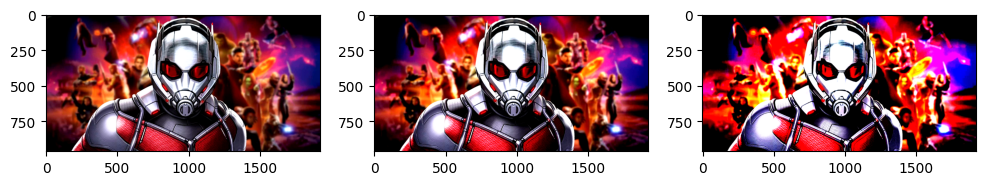

In [38]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

contrast_enhancer = ImageEnhance.Contrast(img)

plt.subplot(1, 3, 1)
plt.imshow(contrast_enhancer.enhance(1.5))

plt.subplot(1, 3, 2)
plt.imshow(contrast_enhancer.enhance(2))

plt.subplot(1, 3, 3)
plt.imshow(contrast_enhancer.enhance(5))

### **c. Brightness Enhancement**

Brightness adjustment modifies the overall intensity of an image, making it appear brighter or darker.

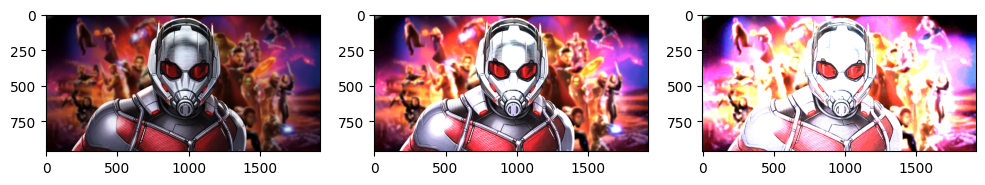

In [39]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

brightness_enhancer = ImageEnhance.Brightness(img)

plt.subplot(1, 3, 1)
plt.imshow(brightness_enhancer.enhance(1))

plt.subplot(1, 3, 2)
plt.imshow(brightness_enhancer.enhance(2))

plt.subplot(1, 3, 3)
plt.imshow(brightness_enhancer.enhance(5))

### **d. Sharpness Enhancement**

Sharpness adjustment enhances the clarity and detail of edges in an image. It accentuates the differences in intensity between adjacent pixels, making edges appear sharper.

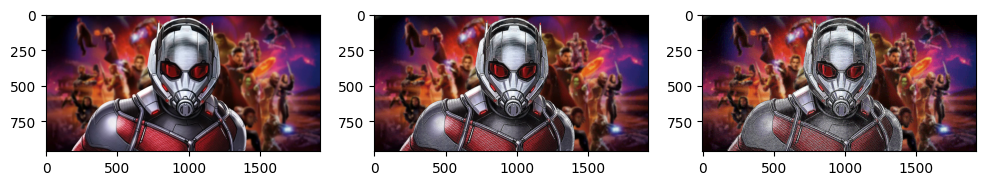

In [40]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

sharpness_enhancer = ImageEnhance.Sharpness(img)

plt.subplot(1, 3, 1)
plt.imshow(sharpness_enhancer.enhance(2))

plt.subplot(1, 3, 2)
plt.imshow(sharpness_enhancer.enhance(20))

plt.subplot(1, 3, 3)
plt.imshow(sharpness_enhancer.enhance(50))

## **Image Filters**

Filtering in image processing refers to the process of applying convolution operations to modify the spatial characteristics of an image. Filters are small matrices or masks that are passed over an image to perform operations like blurring, sharpening, edge detection, and noise reduction. Let's explore some common filtering techniques using the PIL (Python Imaging Library) and provide examples for each.

#### **Question: Why apply Image Filters?**
Image filters are fundamental tools in image processing and computer vision. They are used to enhance images, reduce noise, extract features, and transform images in ways that make subsequent processing steps more effective. By applying appropriate filters, we can preprocess images to improve the performance of subsequent steps like segmentation, object detection, and recognition.

#### **Question: What are Image Filters?**  
Image filters are mathematical operations applied to an image to modify or enhance its appearance. These operations typically involve convolution, where a small matrix called a kernel or filter is moved across the image and combined with the pixel values in the neighborhood.

#### **Types of Image Filters**
1. Smoothing Filters:
> **Problem:** Images often contain noise, which can interfere with analysis.  
> **Purpose:** Reduce noise and detail in an image.   
> **Examples:** Gaussian blur, box blur, median filter.   

2. Sharpening Filters:
> **Problem:** Important features may be subtle or obscured.  
> **Purpose:** Enhance edges and fine details.  
> **Examples:** Laplacian filter, unsharp mask.  

3. Edge Detection Filters:
> **Problem:** Identifying object boundaries is crucial for tasks like segmentation and recognition.  
> **Purpose:** Detect edges and contours.   
> **Examples:** Sobel operator, Canny edge detector, Prewitt filter.    

4. Custom Filters:
> **Purpose:** Perform specific tasks tailored to particular needs.   
> **Examples:** Embossing, custom kernels.     

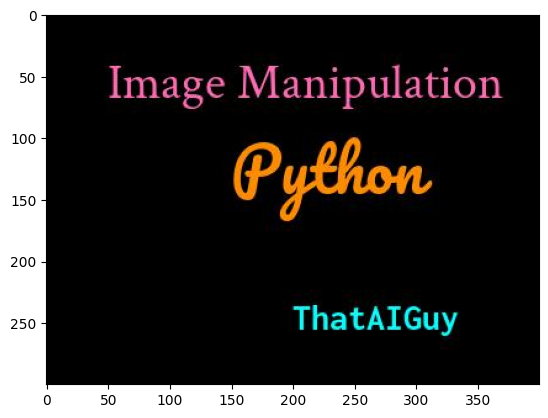

In [41]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open('images/original_imgs/python_image_manipulation.jpg')

plt.imshow(img)

### **a. Gaussian Blur**
Applies a Gaussian function to blur the image.

Gaussian blur is a smoothing filter that reduces image noise and detail by averaging pixel values using a Gaussian kernel. It is effective in removing high-frequency noise and producing a softer appearance.

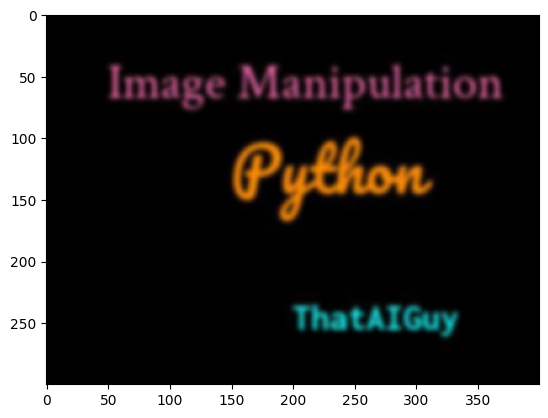

In [42]:
from PIL import ImageFilter

# Apply Gaussian blur
blurred_img = img.filter(ImageFilter.GaussianBlur(radius=2))

plt.imshow(blurred_img)

### **b. Box Blur**

Box blur is a simple smoothing filter that averages pixel values in a local neighborhood. It produces a similar effect to Gaussian blur but with a more uniform blurring effect.


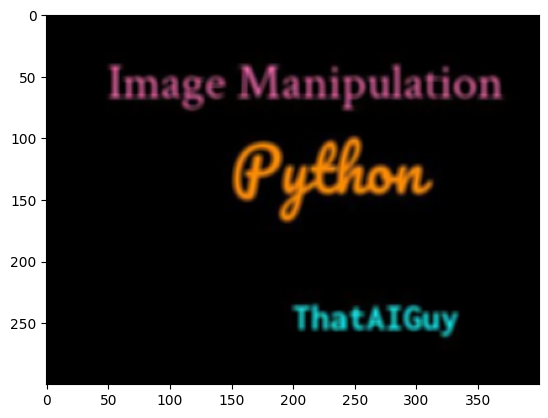

In [43]:
# Apply box blur
blurred_img = img.filter(ImageFilter.BoxBlur(radius=2))

plt.imshow(blurred_img)

### **c. Median Filter**
Replaces each pixel's value with the median of the values in its neighborhood

Median filter is a non-linear filter that replaces each pixel's value with the median value in its neighborhood. It is effective in removing salt-and-pepper noise while preserving edges and details.


Original Image Size: (400, 300)
Filtered Image Size: (400, 300)


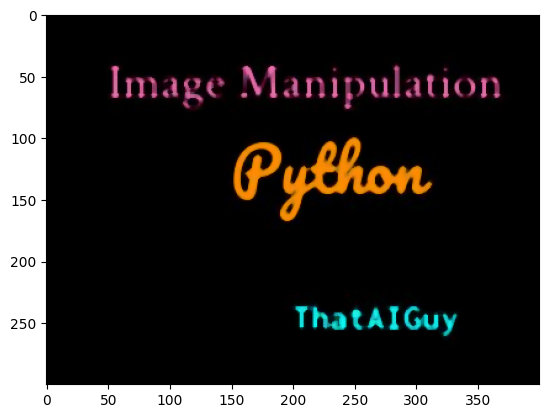

In [44]:
# Apply median filter
filtered_img = img.filter(ImageFilter.MedianFilter(size=5))

plt.imshow(filtered_img)

print("Original Image Size:", img.size)
print("Filtered Image Size:", filtered_img.size)

### **d. Sobel Operator**
Detects edges by calculating the gradient magnitude of the image intensity.

The Sobel operator is a popular edge detection filter that convolves the image with two 3x3 kernels to calculate the gradient in the horizontal and vertical directions.

**Note:**  
The **Canny Edge Detector** is often considered superior to the Sobel operator for edge detection in many aspects, including noise reduction, edge localization, edge connectivity, and performance in low-contrast regions, due to its more sophisticated approach. These advantages make the Canny edge detector more suitable for complex and precise edge detection tasks in computer vision. However, it is also more computationally intensive due to its multi-stage process. For simpler or faster applications, the Sobel operator may still be a valid choice.

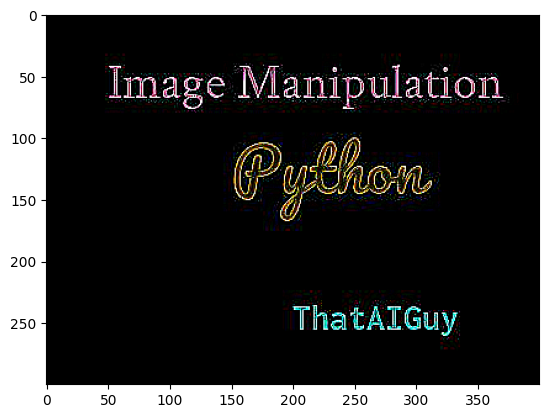

In [45]:
# Apply Sobel edge detection filter
edges_img = img.filter(ImageFilter.FIND_EDGES)

plt.imshow(edges_img)

### **e. Contour Filter**

The CONTOUR filter detects and highlights the edges in an image, producing an outline or contour of the objects present. It emphasizes the transitions between different regions of the image, making edges more pronounced.

It creates an effect similar to drawing the edges with a pen, where sharp transitions between different intensity levels are emphasized.

The CONTOUR filter is a powerful tool for edge detection and creating artistic effects.

**Important Note: Later in feature extraction you will learn that, contour detection involves identifying and tracing the boundaries of objects within an image, `often after edge detection has been performed`.**

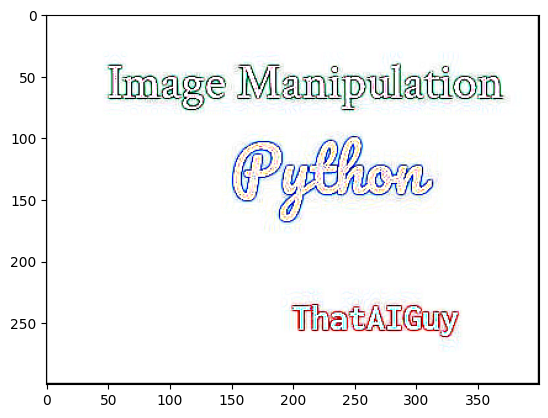

In [46]:
# Apply Sobel edge detection filter
contour_img = img.filter(ImageFilter.CONTOUR)

plt.imshow(contour_img)

### **f. Emboss Filter**

The EMBOSS filter gives the image a 3D effect by highlighting the edges and making them appear as if they are raised or embossed. This filter emphasizes the texture and creates a relief-like effect.

The resulting image appears to have a light source coming from a particular direction, creating shadows and highlights that give the embossed effect.

The EMBOSS filter is a powerful tool for edge detection and creating artistic effects.

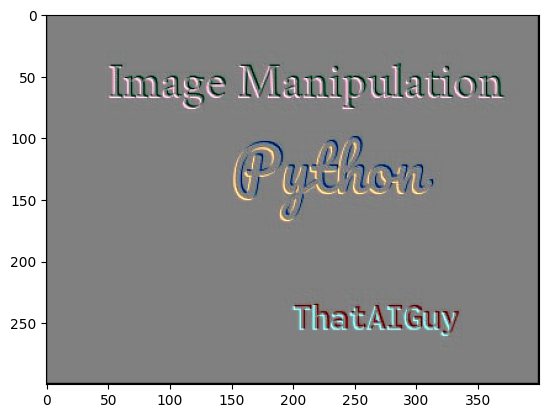

In [47]:
# Apply Sobel edge detection filter
emboss_img = img.filter(ImageFilter.EMBOSS)

plt.imshow(emboss_img)

## **Morphological Operations (Advance Topic)** 
**(IMPLEMENTATION NOT COVERED IN THIS NOTEBOOK)**

Morphological operations are a set of image processing operations that process images based on shapes. They apply a structuring element to an input image, creating an output image of the same size. These operations are particularly useful in binary images but can also be applied to grayscale images.

Morphological operations, particularly erosion and dilation, are powerful tools in image processing and computer vision. They help in noise reduction, object separation, gap filling, and boundary enhancement.

### **Erosion**
**Removes pixels on object boundaries. Useful for eliminating small noise.**  
Erosion is a morphological operation that erodes away the boundaries of the foreground object. It is used to remove small white noise, detach two connected objects, or shrink the objects in the binary image.

**Applications**
> **Noise Reduction:** Removes small-scale noise by eroding away small, unwanted details.  
>  **Object Separation:** Helps in separating touching or overlapping objects in binary images.  
>  **Shape Analysis:** Used in morphological shape analysis, boundary extraction, and image segmentation.  

### **Dilation**
**Adds pixels to object boundaries. Useful for connecting adjacent objects.**  
Dilation is the opposite of erosion. It adds pixels to the boundaries of the objects in an image. This operation is used to grow or thicken objects in a binary image.

**Applications**
> **Gap Filling:** Fills small holes and gaps in the objects.  
> **Object Connection:** Connects disjoint objects or parts of objects.  
> **Boundary Expansion:** Expands the boundaries of objects to enhance or exaggerate features.  

## **Miscellaneous Image Operations in PIL**

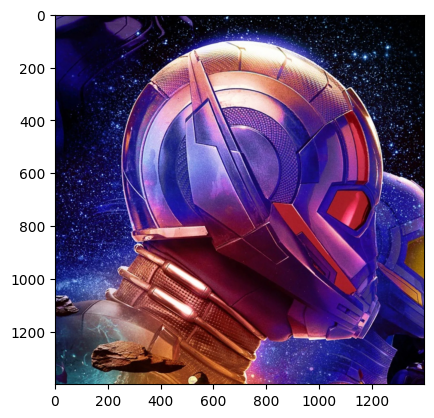

In [48]:
img = Image.open('images/original_imgs/quantumania_1.jpg')

plt.imshow(img)

### **a. Blending Images Together**

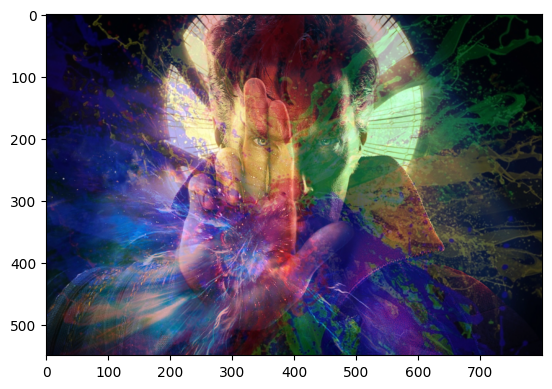

In [49]:
from PIL import Image

# Open the images to be blended
image1 = Image.open('images/original_imgs/ds.jpg')
image2 = Image.open('images/original_imgs/test_image.jpg')

# Resize the images to the same size
image1 = image1.resize((800, 550))
image2 = image2.resize((800, 550))

# Convert images to same mode
image1 = image1.convert('RGB')
image2 = image2.convert('RGB')

# Define the weight of each image
alpha = 0.3

# Blend the images together
blended_img = Image.blend(image1, image2, alpha)

# Display
plt.imshow(blended_img)

### **b. Overlay Images**

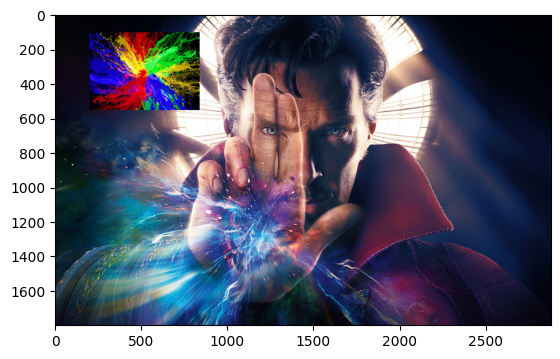

In [50]:
from PIL import Image

# Open the base and overlay images
base_img = Image.open('images/original_imgs/ds.jpg')
overlay_img = Image.open('images/original_imgs/test_image.jpg')

# Convert the overlay image to RGBA mode
overlay_img = overlay_img.convert('RGBA')

# Define the position where the overlay image will be pasted
position = (200, 100)

# Overlay the image over base image
# Parameter: im, box=None, mask=None
base_img.paste(overlay_img, position)

# Display
plt.imshow(base_img)

### **c. Circular Cropping**

Below you can find the Python code that crops a portrait in circular shape in 5 steps.

**Steps:**
1. We will open the image to be cropped (img)
2. We will create a transparent background (background)
3. We will create a transparent mask layer (mask)
4. We will draw a circle on the mask layer (mask)
5. We will paste the img on background based on the mask.

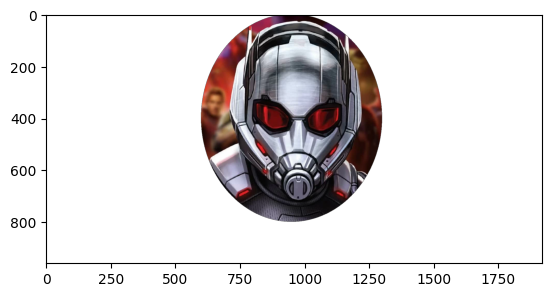

In [51]:
from PIL import Image, ImageDraw

# Read the Image
img = Image.open('images/original_imgs/quantumania_2.png').convert("RGBA")

# Create the transparent(i.e. alpha=0) background.
background = Image.new(mode="RGBA", size=img.size, color=(0, 0, 0, 0))

# Create the transparent(i.e. alpha=0) mask.
mask = Image.new(mode="RGBA", size=img.size, color=(0, 0, 0, 0))

# Create a circle on the mask layer - ImageDraw.ellipse((x0, y0, x1, y1))
draw = ImageDraw.Draw(mask)
draw.ellipse((600, 0, 1300, 800), fill='green', outline=None)

# Paste the 'img' on the 'background' based on the 'mask'
new_img = Image.composite(img, background, mask)

new_img.save('images/transformed/quantumania_cropped.png')

plt.imshow(new_img)